In [2]:
%%capture

from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'15',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '85bae2eb-b23c-4cb9-8688-f52aa6640e58',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)

In [3]:
type(data)

dict

In [4]:
import pandas as pd
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [5]:
df = pd.json_normalize(data['data'])
df['timestamp'] = pd.to_datetime('now')
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10830,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",2.100000e+07,1.963855e+07,1.963855e+07,False,NaN,1,NaN,NaN,None,2024-02-26T20:19:00.000Z,54485.839420,3.162109e+10,107.6480,0.441524,5.091602,5.182577,29.858230,28.215214,42.707003,1.070023e+12,51.2964,1.144203e+12,None,2024-02-26T20:19:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
1,1027,Ethereum,ETH,ethereum,8460,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,1.201554e+08,1.201554e+08,True,NaN,2,NaN,NaN,None,2024-02-26T20:19:00.000Z,3177.563022,1.757587e+10,29.8082,0.307165,2.017376,8.439048,39.838475,34.881855,54.156577,3.818015e+11,18.3113,3.818015e+11,None,2024-02-26T20:19:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
2,825,Tether USDt,USDT,tether,76011,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,9.791073e+10,1.016001e+11,True,NaN,3,NaN,NaN,None,2024-02-26T20:17:00.000Z,1.000848,6.007091e+10,71.6639,0.046683,0.103355,0.074530,0.086431,0.036890,0.042031,9.799378e+10,4.6998,1.016863e+11,None,2024-02-26T20:17:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-26 15:20:18.130400
3,1839,BNB,BNB,bnb,2075,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,1.495430e+08,1.495430e+08,False,NaN,4,NaN,NaN,None,2024-02-26T20:18:00.000Z,398.661729,1.919890e+09,53.6973,0.159183,2.127420,12.974258,30.305305,21.785161,72.721618,5.961706e+10,2.8593,5.961706e+10,None,2024-02-26T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
4,5426,Solana,SOL,solana,626,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,4.412023e+08,5.705436e+08,True,NaN,5,NaN,NaN,None,2024-02-26T20:18:00.000Z,109.451492,2.157548e+09,140.6829,0.231777,5.143966,-2.170430,17.620835,9.582693,88.406811,4.829025e+10,2.3160,6.244685e+10,None,2024-02-26T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
5,52,XRP,XRP,xrp,1235,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",1.000000e+11,5.459425e+10,9.998787e+10,False,NaN,6,NaN,NaN,None,2024-02-26T20:19:00.000Z,0.550367,1.087169e+09,56.7458,0.487914,0.743821,-2.021443,3.796585,-12.589658,-10.091143,3.004686e+10,1.4411,5.503668e+10,None,2024-02-26T20:19:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
6,3408,USDC,USDC,usd-coin,16886,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,2.831250e+10,2.831250e+10,False,NaN,7,NaN,NaN,None,2024-02-26T20:17:00.000Z,1.000129,6.452010e+09,95.3199,0.027289,0.025490,0.015200,-0.012626,-0.012671,0.030776,2.831614e+10,1.3575,2.831614e+10,None,2024-02-26T20:17:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-26 15:20:18.130400
7,2010,Cardano,ADA,cardano,1081,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",4.500000e+10,3.547025e+10,3.665692e+10,False,NaN,8,NaN,NaN,None,2024-02-26T20:18:00.000Z,0.618267,5.669287e+08,69.0743,1.020514,4.719162,-0.473366,26.758447,-0.378313,59.484069,2.193009e+10,1.0518,2.782202e+10,None,2024-02-26T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-26 15:20:18.130400
8,5805,Avalanche,AVAX,avalanche,671,2020-07-13T00:00:00.000Z,"[defi, smart-contracts, three-arrows-capital-p...",7.200000e+0

In [6]:
def api_runner():
    global df
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
      'start':'1',
      'limit':'15',
      'convert':'USD'
    }
    headers = {
      'Accepts': 'application/json',
      'X-CMC_PRO_API_KEY': '85bae2eb-b23c-4cb9-8688-f52aa6640e58',
    }

    session = Session()
    session.headers.update(headers)

    try:
      response = session.get(url, params=parameters)
      data = json.loads(response.text)
      print(data)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
      print(e)

    df = pd.json_normalize(data['data'])
    df['timestamp'] = pd.to_datetime('now')
    df
    
    if not os.path.isfile(r"C:\Users\Titus\Downloads\Reading Files in Pandas\API.csv"):
        df.to_csv(r"C:\Users\Titus\Downloads\Reading Files in Pandas\API.csv", header = 'column_names')
    else:
         df.to_csv(r"C:\Users\Titus\Downloads\Reading Files in Pandas\API.csv", mode ='a', header=False)

In [10]:
%%capture
import os 
from time import time 
from time import sleep

for i in range(333):
    api_runner()
    print('API Runner completed successfully')
    sleep(10) #pulls every 10 seconds
exit()

KeyboardInterrupt: 

In [9]:
df10 = pd.read_csv(r'C:\Users\Titus\Downloads\Reading Files in Pandas\API.csv')
df10

,Unnamed: 0,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,0,1,Bitcoin,BTC,bitcoin,10818,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value...",2.100000e+07,1.962971e+07,1.962971e+07,False,NaN,1,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,51769.871364,3.166176e+10,-15.0014,-0.493187,0.105950,8.644397,21.437680,24.217320,41.550831,1.016228e+12,52.4938,1.087167e+12,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
1,1,1027,Ethereum,ETH,ethereum,8413,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,1.201656e+08,1.201656e+08,True,NaN,2,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,2772.450283,1.824926e+10,-22.8702,-0.352508,-1.714862,11.268171,9.493128,27.619766,41.252384,3.331531e+11,17.2041,3.331531e+11,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
2,2,825,Tether USDt,USDT,tether,74726,2015-02-25T00:00:00.000Z,"['payments', 'stablecoin', 'asset-backed-stabl...",NaN,9.745599e+10,9.960008e+10,True,NaN,3,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,1.000302,5.775589e+10,-15.5092,-0.001414,-0.057352,-0.030978,0.087161,-0.000383,-0.035631,9.748539e+10,5.0342,9.963013e+10,NaN,2024-02-16T20:17:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-16 15:19:39.730989
3,3,1839,BNB,BNB,bnb,2066,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,1.495446e+08,1.495446e+08,False,NaN,4,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,355.683015,1.494152e+09,-11.6714,-0.436148,0.606325,9.826848,15.435736,49.408141,45.446830,5.319047e+10,2.7476,5.319047e+10,NaN,2024-02-16T20:17:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
4,4,5426,Solana,SOL,solana,626,2020-04-10T00:00:00.000Z,"['pos', 'platform', 'solana-ecosystem', 'cms-h...",NaN,4.405009e+08,5.697082e+08,True,NaN,5,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,109.114316,2.102970e+09,-9.5995,-0.388670,-4.330750,3.614469,8.622319,51.421947,85.410223,4.806496e+10,2.4821,6.216332e+10,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
5,5,52,XRP,XRP,xrp,1229,2013-08-04T00:00:00.000Z,"['medium-of-exchange', 'enterprise-solutions',...",1.000000e+11,5.455860e+10,9.998790e+10,False,NaN,6,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,0.562668,1.839434e+09,19.1858,-0.327246,1.531330,6.852975,-1.428261,-6.875447,-8.141723,3.069840e+10,1.5857,5.626684e+10,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
6,6,3408,USDC,USDC,usd-coin,16728,2018-10-08T00:00:00.000Z,"['medium-of-exchange', 'stablecoin', 'asset-ba...",NaN,2.809524e+10,2.809524e+10,False,NaN,7,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,0.999977,6.594629e+09,-9.1880,0.016084,0.008309,-0.003563,-0.038209,-0.041601,-0.007568,2.809459e+10,1.4512,2.809459e+10,NaN,2024-02-16T20:18:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-16 15:19:39.730989
7,7,2010,Cardano,ADA,cardano,1074,2017-10-01T00:00:00.000Z,"['dpos', 'pos', 'platform', 'research', 'smart...",4.500000e+10,3.545136e+10,3.662821e+10,False,NaN,8,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,0.590899,6.051426e+08,-17.7516,-0.326348,-1.862836,8.772214,12.061105,2.545195,58.306596,2.094819e+10,1.0818,2.659048e+10,NaN,2024-02-16T20:17:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
8,8,5805,Avalanche,AVAX,avalanche,664,2020-07-13T00:00:00.000Z,"['defi', 'smart-contracts', 'three-a

In [11]:
pd.set_option('display.float_format',lambda x: '%.5f' % x)

In [12]:
df10

,Unnamed: 0,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,0,1,Bitcoin,BTC,bitcoin,10818,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value...",21000000.00000,19629712.00000,19629712.00000,False,NaN,1,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,51769.87136,31661759202.72533,-15.00140,-0.49319,0.10595,8.64440,21.43768,24.21732,41.55083,1016227665146.76196,52.49380,1087167298638.00000,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
1,1,1027,Ethereum,ETH,ethereum,8413,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,120165596.08996,120165596.08996,True,NaN,2,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,2772.45028,18249260745.63980,-22.87020,-0.35251,-1.71486,11.26817,9.49313,27.61977,41.25238,333153140943.21698,17.20410,333153140943.21997,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
2,2,825,Tether USDt,USDT,tether,74726,2015-02-25T00:00:00.000Z,"['payments', 'stablecoin', 'asset-backed-stabl...",NaN,97455987376.17133,99600078701.92628,True,NaN,3,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,1.00030,57755890177.05392,-15.50920,-0.00141,-0.05735,-0.03098,0.08716,-0.00038,-0.03563,97485391060.37772,5.03420,99630129285.17000,NaN,2024-02-16T20:17:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2024-02-16 15:19:39.730989
3,3,1839,BNB,BNB,bnb,2066,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,149544597.21452,149544597.21452,False,NaN,4,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,355.68301,1494151566.81794,-11.67140,-0.43615,0.60633,9.82685,15.43574,49.40814,45.44683,53190473207.28091,2.74760,53190473207.28000,NaN,2024-02-16T20:17:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
4,4,5426,Solana,SOL,solana,626,2020-04-10T00:00:00.000Z,"['pos', 'platform', 'solana-ecosystem', 'cms-h...",NaN,440500913.93261,569708185.76225,True,NaN,5,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,109.11432,2102970394.28681,-9.59950,-0.38867,-4.33075,3.61447,8.62232,51.42195,85.41022,48064955756.84991,2.48210,62163318796.58000,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
5,5,52,XRP,XRP,xrp,1229,2013-08-04T00:00:00.000Z,"['medium-of-exchange', 'enterprise-solutions',...",100000000000.00000,54558598490.00000,99987895338.00000,False,NaN,6,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,0.56267,1839433721.56843,19.18580,-0.32725,1.53133,6.85297,-1.42826,-6.87545,-8.14172,30698397100.91257,1.58570,56266835935.20000,NaN,2024-02-16T20:18:00.000Z,NaN,NaN,NaN,NaN,NaN,2024-02-16 15:19:39.730989
6,6,3408,USDC,USDC,usd-coin,16728,2018-10-08T00:00:00.000Z,"['medium-of-exchange', 'stablecoin', 'asset-ba...",NaN,28095243388.95145,28095243388.95145,False,NaN,7,NaN,NaN,NaN,2024-02-16T20:18:00.000Z,0.99998,6594629302.36719,-9.18800,0.01608,0.00831,-0.00356,-0.03821,-0.04160,-0.00757,28094586583.85914,1.45120,28094586583.86000,NaN,2024-02-16T20:18:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2024-02-16 15:19:39.730989
7,7,2010,Cardano,ADA,cardano,1074,2017-10-01T00:00:00.000Z,"['dpos', 'pos', 'platform', 'research', 'smart...",45000000000.00000,35451362106.65500,36628205944.37800,False,NaN,8,NaN,NaN,NaN,2024-02-16T20:17:00.000Z,0.59090,605142619.12979,-17.75160,-0.32635,-1.86284,8.77221,12.06111,2.54520,58.30660,20948191910.17009,1.08180,26590477204.28000,NaN,2024-02-1

In [13]:
df3 =df.groupby('name',sort=False)[['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d']].mean()
df3

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,0.24308,4.76514,4.96811,29.55551,27.89883,42.67549
Ethereum,0.32876,1.95005,8.25683,39.57211,34.59621,54.11409
Tether USDt,0.04186,0.08715,0.07213,0.07916,0.05492,0.02073
BNB,0.07206,2.26848,13.09522,30.37430,21.83247,72.85702
Solana,-0.06170,5.27803,-2.11654,17.56613,9.37216,88.28238
XRP,0.17619,0.64512,-2.10718,3.64289,-12.73334,-10.15652
USDC,0.01600,-0.00790,-0.00353,-0.01805,-0.01318,-0.00547
Cardano,0.64091,4.66691,-0.43678,26.70173,-0.58999,59.42421
Avalanche,0.50977,4.91442,-0.90733,18.95507,-1.71044,88.60273


In [14]:
df4 = df3.stack()
df4

name                                     
Bitcoin      quote.USD.percent_change_1h      0.24308
             quote.USD.percent_change_24h     4.76514
             quote.USD.percent_change_7d      4.96811
             quote.USD.percent_change_30d    29.55551
             quote.USD.percent_change_60d    27.89883
             quote.USD.percent_change_90d    42.67549
Ethereum     quote.USD.percent_change_1h      0.32876
             quote.USD.percent_change_24h     1.95005
             quote.USD.percent_change_7d      8.25683
             quote.USD.percent_change_30d    39.57211
             quote.USD.percent_change_60d    34.59621
             quote.USD.percent_change_90d    54.11409
Tether USDt  quote.USD.percent_change_1h      0.04186
             quote.USD.percent_change_24h     0.08715
             quote.USD.percent_change_7d      0.07213
             quote.USD.percent_change_30d     0.07916
             quote.USD.percent_change_60d     0.05492
             quote.USD.percent_change_90

In [16]:
df5 = df4.to_frame(name='values')
df5

values
name                                              
Bitcoin     quote.USD.percent_change_1h    0.24308
            quote.USD.percent_change_24h   4.76514
            quote.USD.percent_change_7d    4.96811
            quote.USD.percent_change_30d  29.55551
            quote.USD.percent_change_60d  27.89883
            quote.USD.percent_change_90d  42.67549
Ethereum    quote.USD.percent_change_1h    0.32876
            quote.USD.percent_change_24h   1.95005
            quote.USD.percent_change_7d    8.25683
            quote.USD.percent_change_30d  39.57211
            quote.USD.percent_change_60d  34.59621
            quote.USD.percent_change_90d  54.11409
Tether USDt quote.USD.percent_change_1h    0.04186
            quote.USD.percent_change_24h   0.08715
            quote.USD.percent_change_7d    0.07213
            quote.USD.percent_change_30d   0.07916
            quote.USD.percent_change_60d   0.05492
            quote.USD.percent_change_90d   0.02073
BNB         quote.USD.percent_change_1h    0.07206
            quote.USD.percent_change_24h   2.26848
            quote.USD.percent_change_7d   13.09522
            quote.USD.percent_change_30d  30.37430
            quote.USD.percent_change_60d  21.83247
            quote.USD.percent_change_90d  72.85702
Solana      quote.USD.percent_change_1h   -0.06170
            quote.USD.percent_change_24h   5.27803
            quote.USD.percent_change_7d   -2.11654
            quote.USD.percent_change_30d  17.56613
            quote.USD.percent_change_60d   9.37216
            quote.USD.percent_change_90d  88.28238
XRP         quote.USD.percent_change_1h    0.17619
            quote.USD.percent_change_24h   0.64512
            quote.USD.percent_change_7d   -2.10718
            quote.USD.percent_change_30d   3.64289
            quote.USD.percent_change_60d -12.73334
            quote.USD.percent_change_90d -10.15652
USDC        quote.USD.percent_change_1h    0.01600
            quote.USD.percent_change_24h  -0.00790
            quote.USD.percent_change_7d   -0.00353
            quote.USD.percent_change_30d  -0.01805
            quote.USD.percent_change_60d  -0.01318
            quote.USD.percent_change_90d  -0.00547
Cardano     quote.USD.percent_change_1h    0.64091
            quote.USD.percent_change_24h   4.66691
            quote.USD.percent_change_7d   -0.43678
            quote.USD.percent_change_30d  26.70173
            quote.USD.percent_change_60d  -0.58999
            quote.USD.percent_change_90d  59.42421
Avalanche   quote.USD.percent_change_1h    0.50977
            quote.USD.percent_change_24h   4.91442
            quote.USD.percent_change_7d   -0.90733
            quote.USD.percent_change_30d  18.95507
            quote.USD.percent_change_60d  -1.71044
            quote.USD.percent_change_90d  88.60273
Dogecoin    quote.USD.percent_change_1h    0.57371
            quote.USD.percent_change_24h   2.07643
            quote.USD.percent_change_7d   -1.02622
            quote.USD.percent_change_30d  10.10664
            quote.USD.percent_change_60d  -3.68306
            quote.USD.percent_change_90d   9.66595
TRON        quote.USD.percent_change_1h    0.06953
            quote.USD.percent_change_24h   1.46826
            quote.USD.percent_change_7d    2.45884
            quote.USD.percent_change_30d  24.42896
            quote.USD.percent_change_60d  32.98735
            quote.USD.percent_change_90d  35.28048
Chainlink   quote.USD.percent_change_1h    0.55654
            quote.USD.percent_change_24h   1.95065
            quote.USD.percent_change_7d   -4.05308
            quote.USD.percent_change_30d  33.53414
            quote.USD.percent_change_60d  17.07854
            quote.USD.percent_change_90d  31.26967
Polkadot    quote.USD.percent_change_1h    0.34598
            quote.USD.percent_change_24h   2.22781
            quote.USD.percent_change_7d    3.64958
            quote.USD.percent_change_30d  20.52431
            quote.USD.percent_change_60d  -3.90730
            quo

In [17]:
df5.count()

values    90
dtype: int64

In [18]:
index = pd.Index(range(90))

df6 = df5.reset_index()
df6

,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,0.24308
1,Bitcoin,quote.USD.percent_change_24h,4.76514
2,Bitcoin,quote.USD.percent_change_7d,4.96811
3,Bitcoin,quote.USD.percent_change_30d,29.55551
4,Bitcoin,quote.USD.percent_change_60d,27.89883
5,Bitcoin,quote.USD.percent_change_90d,42.67549
6,Ethereum,quote.USD.percent_change_1h,0.32876
7,Ethereum,quote.USD.percent_change_24h,1.95005
8,Ethereum,quote.USD.percent_change_7d,8.25683
9,Ethereum,quote.USD.percent_change_30d,39.57211


In [19]:
df7 = df6.rename(columns={'level_1': 'percent_change'})
df7

,name,percent_change,values
0,Bitcoin,quote.USD.percent_change_1h,0.24308
1,Bitcoin,quote.USD.percent_change_24h,4.76514
2,Bitcoin,quote.USD.percent_change_7d,4.96811
3,Bitcoin,quote.USD.percent_change_30d,29.55551
4,Bitcoin,quote.USD.percent_change_60d,27.89883
5,Bitcoin,quote.USD.percent_change_90d,42.67549
6,Ethereum,quote.USD.percent_change_1h,0.32876
7,Ethereum,quote.USD.percent_change_24h,1.95005
8,Ethereum,quote.USD.percent_change_7d,8.25683
9,Ethereum,quote.USD.percent_change_30d,39.57211


In [20]:
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_1h'],['1hr'])
df7

,name,percent_change,values
0,Bitcoin,1hr,0.24308
1,Bitcoin,quote.USD.percent_change_24h,4.76514
2,Bitcoin,quote.USD.percent_change_7d,4.96811
3,Bitcoin,quote.USD.percent_change_30d,29.55551
4,Bitcoin,quote.USD.percent_change_60d,27.89883
5,Bitcoin,quote.USD.percent_change_90d,42.67549
6,Ethereum,1hr,0.32876
7,Ethereum,quote.USD.percent_change_24h,1.95005
8,Ethereum,quote.USD.percent_change_7d,8.25683
9,Ethereum,quote.USD.percent_change_30d,39.57211


In [21]:
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_1h'],['1hr'])
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_24h'],['24hr'])
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_7d'],['7d'])
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_30d'],['30d'])
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_60d'],['60d'])
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_90d'],['90d'])
df7

,name,percent_change,values
0,Bitcoin,1hr,0.24308
1,Bitcoin,24hr,4.76514
2,Bitcoin,7d,4.96811
3,Bitcoin,30d,29.55551
4,Bitcoin,60d,27.89883
5,Bitcoin,90d,42.67549
6,Ethereum,1hr,0.32876
7,Ethereum,24hr,1.95005
8,Ethereum,7d,8.25683
9,Ethereum,30d,39.57211


In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

C:\Users\Titus\New folder\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


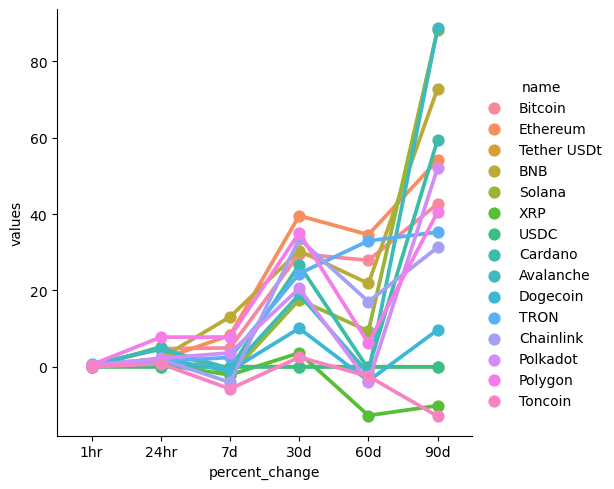

In [23]:
sns.catplot(x='percent_change', y ='values', hue='name', data=df7,kind='point')